In [24]:
# Importación de bibliotecas necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astroquery.nasa_exoplanet_archive import NasaExoplanetArchive
from astroquery.gaia import Gaia
from astropy.coordinates import SkyCoord
import astropy.units as u

In [25]:
# Bloque 1: Obtención de datos de exoplanetas
from astroquery.nasa_exoplanet_archive import NasaExoplanetArchive

def cargar_exoplanetas():
    # Realizamos la consulta directamente sin obtener la información de la tabla
    exoplanets = NasaExoplanetArchive.query_criteria(
        table="ps",
        select="pl_name,pl_orbper,pl_rade,pl_bmasse,sy_dist,ra,dec",
        order="pl_name"
    )
    return exoplanets.to_pandas()

try:
    exoplanetas = cargar_exoplanetas()
    print("\nPrimeras filas de los datos de exoplanetas:")
    print(exoplanetas.head())
    print(f"\nTotal de exoplanetas cargados: {len(exoplanetas)}")
except Exception as e:
    print(f"Error al cargar los exoplanetas: {str(e)}")
    print("Intentando una consulta SQL directa...")
    
    # Si falla, intentamos con una consulta SQL directa
    query = """
    SELECT pl_name, pl_orbper, pl_rade, pl_bmasse, sy_dist, ra, dec
    FROM ps
    ORDER BY pl_name
    """
    try:
        exoplanetas = NasaExoplanetArchive.query_sql(query).to_pandas()
        print("\nPrimeras filas de los datos de exoplanetas (usando SQL):")
        print(exoplanetas.head())
        print(f"\nTotal de exoplanetas cargados: {len(exoplanetas)}")
    except Exception as e:
        print(f"Error al realizar la consulta SQL: {str(e)}")
        print("Por favor, verifica tu conexión a internet y la disponibilidad del servicio NASA Exoplanet Archive.")


Primeras filas de los datos de exoplanetas:
    pl_name  pl_orbper  pl_rade   pl_bmasse   sy_dist          ra        dec  \
0  11 Com b        NaN      NaN  5434.70000   93.1846  185.178779  17.793252   
1  11 Com b  326.03000      NaN  6165.60000   93.1846  185.178779  17.793252   
2  11 Com b  323.21000      NaN  4914.89849   93.1846  185.178779  17.793252   
3  11 UMi b  516.21997      NaN  4684.81420  125.3210  229.274595  71.823943   
4  11 UMi b        NaN      NaN  3432.40000  125.3210  229.274595  71.823943   

   sky_coord.ra  sky_coord.dec  
0    185.178779      17.793252  
1    185.178779      17.793252  
2    185.178779      17.793252  
3    229.274595      71.823943  
4    229.274595      71.823943  

Total de exoplanetas cargados: 36404


Variables: 

1. pl_name: Nombre del planeta.
2. pl_orbper: Período orbital del planeta en días.
3. pl_rade: Radio del planeta en radios terrestres.
4. pl_bmasse: Masa del planeta en masas terrestres.
5. sy_dist: Distancia al sistema estelar en parsecs.
6. ra: Ascensión Recta (Right Ascension) en grados. Es una coordenada celestial que indica la posición este-oeste del objeto en el cielo.
7. dec: Declinación en grados. Es una coordenada celestial que indica la posición norte-sur del objeto en el cielo.
8. sky_coord.ra: Parece ser una duplicación de la columna 'ra', posiblemente en un formato diferente o como parte de un objeto SkyCoord de Astropy.
9. sky_coord.dec: Parece ser una duplicación de la columna 'dec', posiblemente en un formato diferente o como parte de un objeto SkyCoord de Astropy.
- Las columnas sky_coord.ra y sky_coord.dec probablemente fueron añadidas automáticamente cuando se convirtieron las coordenadas a objetos SkyCoord de Astropy. 
- En la mayoría de los casos, puedes usar las columnas ra y dec para tus cálculos y visualizaciones.

In [26]:
# Bloque 2: Obtención de datos de estrellas de Gaia
from astroquery.gaia import Gaia
from astropy.coordinates import SkyCoord
import astropy.units as u

def obtener_estrellas(ra, dec, radio=5):
    coord = SkyCoord(ra=ra*u.deg, dec=dec*u.deg, frame='icrs')
    width = u.Quantity(radio, u.deg)
    height = u.Quantity(radio, u.deg)
    
    job = Gaia.launch_job_async(f"""
        SELECT source_id, ra, dec, phot_g_mean_mag
        FROM gaiadr3.gaia_source
        WHERE 1=CONTAINS(
            POINT('ICRS', ra, dec),
            BOX('ICRS', {ra}, {dec}, {width.value}, {height.value})
        )
        AND phot_g_mean_mag < 15
    """)
    
    return job.get_results().to_pandas()

# Ejemplo de uso con un exoplaneta específico
exoplaneta_ejemplo = exoplanetas.iloc[0]
try:
    estrellas = obtener_estrellas(exoplaneta_ejemplo['ra'], exoplaneta_ejemplo['dec'])
    print("Primeras filas de los datos de estrellas:")
    print(estrellas.head())
    print(f"Total de estrellas obtenidas: {len(estrellas)}")
except Exception as e:
    print(f"Error al obtener datos de estrellas: {str(e)}")
    print("Verifica tu conexión a internet y la disponibilidad del servicio Gaia.")

INFO: Query finished. [astroquery.utils.tap.core]
Primeras filas de los datos de estrellas:
             SOURCE_ID          ra        dec  phot_g_mean_mag
0  3933635206376457728  187.470787  15.367647        14.738473
1  3945394002200282496  186.091325  15.890714        14.852983
2  3945394380157403392  186.008719  15.877038        13.689665
3  3945395376589813888  185.893949  15.829553         9.915957
4  3945396269943001216  185.844863  15.840023        14.459597
Total de estrellas obtenidas: 3685


Variables:
1. SOURCE_ID: Es un identificador único para cada estrella en el catálogo Gaia. Es un número largo que permite identificar de manera inequívoca cada objeto en la base de datos de Gaia.
2. ra: Ascensión Recta (Right Ascension) en grados. Es una coordenada celestial que indica la posición este-oeste del objeto en el cielo. Es equivalente a la longitud en la superficie terrestre.
3. dec: Declinación en grados. Es una coordenada celestial que indica la posición norte-sur del objeto en el cielo. Es equivalente a la latitud en la superficie terrestre.
phot_g_mean_mag: Magnitud media en la banda G de Gaia. Es una medida del brillo de la estrella en la banda fotométrica G del satélite Gaia. Valores más bajos indican estrellas más brillantes.

Algunas notas adicionales:
- Las coordenadas ra y dec juntas definen la posición precisa de una estrella en el cielo.
- La magnitud (phot_g_mean_mag) es una escala logarítmica inversa, lo que significa que valores más bajos indican estrellas más brillantes. Por ejemplo, una estrella con magnitud 0 es más brillante que una estrella con magnitud 5.
- El total de 3685 estrellas obtenidas indica que se han encontrado este número de estrellas en el área del cielo que has consultado alrededor del exoplaneta de ejemplo.
- Estas variables son cruciales para tu visualización del cielo, ya que ra y dec te permitirán posicionar las estrellas en tu gráfico, mientras que phot_g_mean_mag te permitirá representar el brillo de las estrellas, por ejemplo, mediante el tamaño o el color de los puntos en tu visualización.

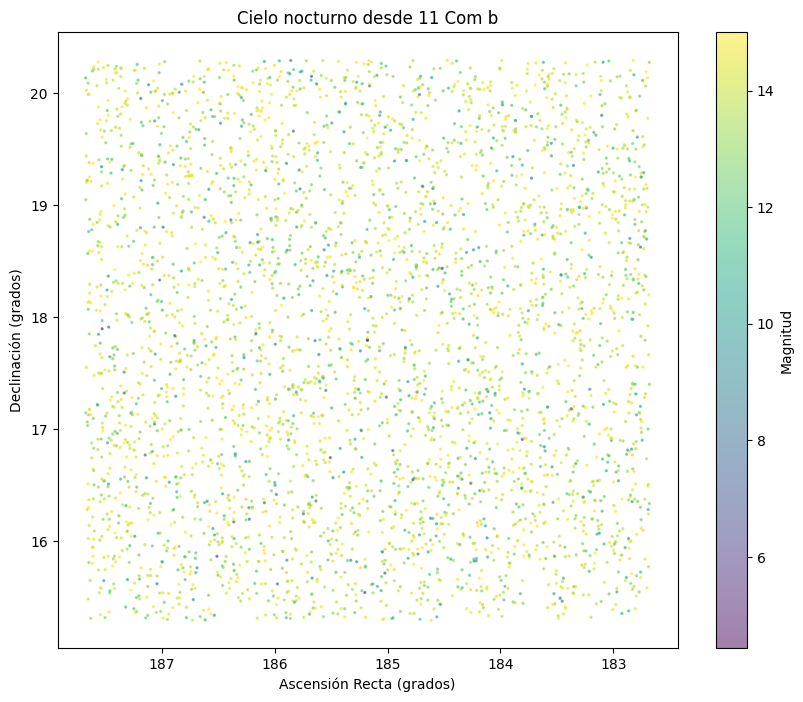

In [27]:
# Bloque 3: Visualización básica del cielo
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.scatter(estrellas['ra'], estrellas['dec'], c=estrellas['phot_g_mean_mag'], 
            cmap='viridis', s=2, alpha=0.5)
plt.colorbar(label='Magnitud')
plt.title(f"Cielo nocturno desde {exoplaneta_ejemplo['pl_name']}")
plt.xlabel('Ascensión Recta (grados)')
plt.ylabel('Declinación (grados)')
plt.gca().invert_xaxis()  # Convención astronómica
plt.show()

In [28]:
# Bloque 4: Función para mostrar información del exoplaneta
def mostrar_info_exoplaneta(exoplaneta):
    print(f"Información sobre {exoplaneta['pl_name']}:")
    print(f"Distancia: {exoplaneta['sy_dist']:.2f} parsecs")
    print(f"Período orbital: {exoplaneta['pl_orbper']:.2f} días")
    print(f"Radio: {exoplaneta['pl_rade']:.2f} radios terrestres")
    print(f"Masa: {exoplaneta['pl_bmasse']:.2f} masas terrestres")

# Seleccionar un exoplaneta de ejemplo (por ejemplo, el primero de la lista)
exoplaneta_ejemplo = exoplanetas.iloc[0]

# Mostrar la información del exoplaneta de ejemplo
mostrar_info_exoplaneta(exoplaneta_ejemplo)

# Imprimir las columnas disponibles en el DataFrame de exoplanetas
print("\nColumnas disponibles en el DataFrame de exoplanetas:")
print(exoplanetas.columns)

Información sobre 11 Com b:
Distancia: 93.18 parsecs
Período orbital: nan días
Radio: nan radios terrestres
Masa: 5434.70 masas terrestres

Columnas disponibles en el DataFrame de exoplanetas:
Index(['pl_name', 'pl_orbper', 'pl_rade', 'pl_bmasse', 'sy_dist', 'ra', 'dec',
       'sky_coord.ra', 'sky_coord.dec'],
      dtype='object')


In [29]:
def mostrar_info_exoplaneta(exoplaneta):
    print(f"Información sobre {exoplaneta['pl_name']}:")
    print(f"Distancia al sistema: {exoplaneta['sy_dist']:.2f} parsecs")
    print(f"Período orbital: {exoplaneta['pl_orbper']:.2f} días")
    print(f"Radio: {exoplaneta['pl_rade']:.2f} radios terrestres")
    print(f"Masa: {exoplaneta['pl_bmasse']:.2f} masas terrestres")
    print(f"Posición en el cielo:")
    print(f"  Ascensión Recta: {exoplaneta['ra']:.4f} grados")
    print(f"  Declinación: {exoplaneta['dec']:.4f} grados")

# Seleccionar un exoplaneta de ejemplo (por ejemplo, el primero de la lista)
exoplaneta_ejemplo = exoplanetas.iloc[0]

# Mostrar la información del exoplaneta de ejemplo
mostrar_info_exoplaneta(exoplaneta_ejemplo)

Información sobre 11 Com b:
Distancia al sistema: 93.18 parsecs
Período orbital: nan días
Radio: nan radios terrestres
Masa: 5434.70 masas terrestres
Posición en el cielo:
  Ascensión Recta: 185.1788 grados
  Declinación: 17.7933 grados


In [30]:
# Bloque 5: Guardar datos procesados
exoplanetas.to_csv('Output/exoplanetas_procesados.csv', index=False)
estrellas.to_csv('Output/estrellas.csv', index=False)
print("Datos guardados en archivos CSV.")

Datos guardados en archivos CSV.


In [31]:
exoplanetas.head()

,pl_name,pl_orbper,pl_rade,pl_bmasse,sy_dist,ra,dec,sky_coord.ra,sky_coord.dec
0,11 Com b,NaN,NaN,5434.70000,93.1846,185.178779,17.793252,185.178779,17.793252
1,11 Com b,326.03000,NaN,6165.60000,93.1846,185.178779,17.793252,185.178779,17.793252
2,11 Com b,323.21000,NaN,4914.89849,93.1846,185.178779,17.793252,185.178779,17.793252
3,11 UMi b,516.21997,NaN,4684.81420,125.3210,229.274595,71.823943,229.274595,71.823943
4,11 UMi b,NaN,NaN,3432.40000,125.3210,229.274595,71.823943,229.274595,71.823943


In [32]:
estrellas.head()

,SOURCE_ID,ra,dec,phot_g_mean_mag
0,3933635206376457728,187.470787,15.367647,14.738473
1,3945394002200282496,186.091325,15.890714,14.852983
2,3945394380157403392,186.008719,15.877038,13.689665
3,3945395376589813888,185.893949,15.829553,9.915957
4,3945396269943001216,185.844863,15.840023,14.459597


In [46]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

def crear_mapa_estelar_mejorado(exoplaneta, estrellas):
    # Filtrar estrellas por magnitud para mostrar solo las más brillantes
    estrellas_visibles = estrellas[estrellas['phot_g_mean_mag'] < 16]
    
    # Calcular el tamaño de las estrellas basado en su magnitud
    tamano_estrellas = 20 / (estrellas_visibles['phot_g_mean_mag'] + 5)
    
    fig = px.scatter(
        estrellas_visibles,
        x='ra',
        y='dec',
        size=tamano_estrellas,
        color='phot_g_mean_mag',
        color_continuous_scale='Viridis',
        hover_name='SOURCE_ID',
        hover_data={
            'ra': ':.2f',
            'dec': ':.2f',
            'phot_g_mean_mag': ':.2f'
        },
        labels={
            'ra': 'Ascensión Recta (grados)',
            'dec': 'Declinación (grados)',
            'phot_g_mean_mag': 'Magnitud'
        },
        title=f'Cielo nocturno desde {exoplaneta["pl_name"]}'
    )
    
    # Añadir etiquetas para las estrellas más brillantes
    estrellas_brillantes = estrellas_visibles[estrellas_visibles['phot_g_mean_mag'] < 10]
    for _, estrella in estrellas_brillantes.iterrows():
        fig.add_annotation(
            x=estrella['ra'],
            y=estrella['dec'],
            text=f"Estrella {estrella['SOURCE_ID']}",
            showarrow=False,
            yshift=10,
            font=dict(size=8, color="white")
        )
    
    fig.update_layout(
        xaxis=dict(autorange='reversed'),
        dragmode='pan',
        hovermode='closest',
        plot_bgcolor='black',
        paper_bgcolor='black',
        font_color='white'
    )
    
    # Añadir controles de zoom
    fig.update_layout(
        updatemenus=[
            dict(
                type="buttons",
                direction="left",
                buttons=[
                    dict(args=[{"visible": [True, True]}],
                         label="Reset Zoom",
                         method="relayout"
                    )
                ],
                pad={"r": 10, "t": 10},
                showactive=False,
                x=0.11,
                xanchor="left",
                y=1.1,
                yanchor="top"
            ),
        ]
    )
    
    return fig

exoplaneta_ejemplo = exoplanetas.iloc[0]
fig = crear_mapa_estelar_mejorado(exoplaneta_ejemplo, estrellas)
fig.show()

In [52]:
import numpy as np

def calcular_brillo_aparente(estrellas, exoplaneta):
    distancia_exoplaneta = exoplaneta['sy_dist']
    estrellas['brillo_aparente'] = estrellas['phot_g_mean_mag'] + 5 * np.log10(distancia_exoplaneta / 10)
    return estrellas

def graficar_comparacion_brillo(estrellas_con_brillo):
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(
        x=estrellas_con_brillo['phot_g_mean_mag'],
        y=estrellas_con_brillo['brillo_aparente'],
        mode='markers',
        marker=dict(
            size=5,
            color=estrellas_con_brillo['phot_g_mean_mag'],
            colorscale='Viridis',
            showscale=True
        ),
        text=estrellas_con_brillo['SOURCE_ID'],
        hoverinfo='text+x+y'
    ))
    
    fig.update_layout(
        title='Comparación de brillo real vs aparente',
        xaxis_title='Magnitud real',
        yaxis_title='Magnitud aparente desde el exoplaneta',
        hovermode='closest'
    )
    
    return fig

estrellas_con_brillo = calcular_brillo_aparente(estrellas, exoplaneta_ejemplo)
fig_brillo = graficar_comparacion_brillo(estrellas_con_brillo)
fig_brillo.show()

In [49]:
import plotly.graph_objects as go
import numpy as np

def simular_orbita(exoplaneta, estrellas, num_pasos=100):
    periodo_orbital = exoplaneta['pl_orbper']
    if np.isnan(periodo_orbital):
        periodo_orbital = 365  # Valor predeterminado si no hay datos
    
    tiempo = np.linspace(0, periodo_orbital, num_pasos)
    
    # Limitar el número de estrellas para mejorar el rendimiento
    estrellas_limitadas = estrellas.sort_values('phot_g_mean_mag').head(1000)
    
    frames = []
    for t in tiempo:
        # Simular rotación del cielo (esto es una simplificación)
        estrellas_rotadas = estrellas_limitadas.copy()
        estrellas_rotadas['ra'] = (estrellas_rotadas['ra'] + t * 360 / periodo_orbital) % 360
        
        frame = go.Frame(data=[
            go.Scatter(
                x=estrellas_rotadas['ra'],
                y=estrellas_rotadas['dec'],
                mode='markers',
                marker=dict(
                    size=5,
                    color=estrellas_rotadas['phot_g_mean_mag'],
                    colorscale='Viridis',
                    showscale=True,
                    colorbar=dict(title='Magnitud')
                ),
                text=estrellas_rotadas['SOURCE_ID'],
                hoverinfo='text'
            ),
            # Añadir un marcador para el exoplaneta
            go.Scatter(
                x=[180],  # Posición fija en el centro
                y=[0],
                mode='markers',
                marker=dict(size=15, color='red', symbol='star'),
                name='Exoplaneta'
            )
        ])
        frames.append(frame)
    
    fig = go.Figure(
        data=frames[0].data,
        layout=go.Layout(
            title=f"Simulación de órbita de {exoplaneta['pl_name']}",
            xaxis=dict(range=[0, 360], autorange=False, title='Ascensión Recta (grados)'),
            yaxis=dict(title='Declinación (grados)'),
            updatemenus=[dict(
                type="buttons",
                buttons=[dict(label="Play", method="animate", args=[None, {"frame": {"duration": 50, "redraw": True}, "fromcurrent": True}])]
            )],
            annotations=[
                dict(
                    text="El exoplaneta está en el centro. Las estrellas rotan alrededor.",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.5, y=1.05
                )
            ]
        ),
        frames=frames
    )
    
    fig.update_layout(
        plot_bgcolor='black',
        paper_bgcolor='black',
        font_color='white'
    )
    
    return fig

exoplaneta_ejemplo = exoplanetas.iloc[0]
fig_orbita = simular_orbita(exoplaneta_ejemplo, estrellas)
fig_orbita.show()

INFO: Query finished. [astroquery.utils.tap.core]


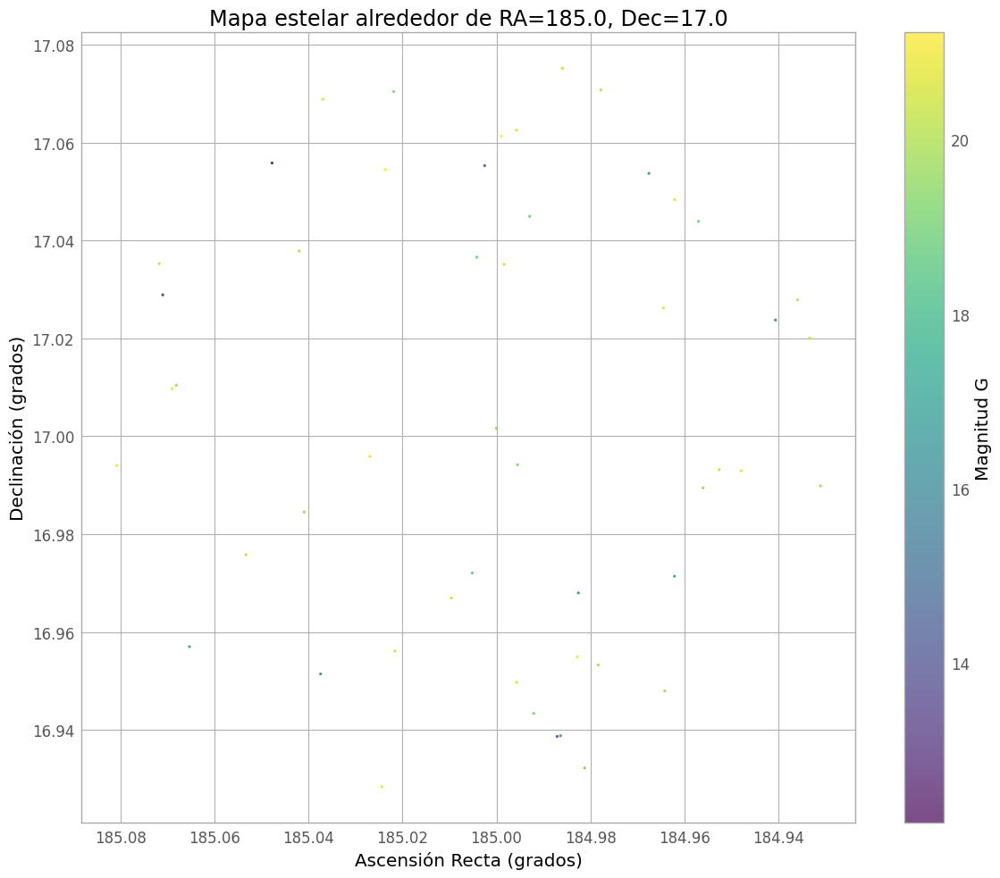

In [50]:
from astropy import units as u
from astropy.coordinates import SkyCoord
from astroquery.gaia import Gaia
from astropy.visualization import astropy_mpl_style
import matplotlib.pyplot as plt

# Configurar el estilo de Astropy para matplotlib
plt.style.use(astropy_mpl_style)

# Función para obtener datos de Gaia
def obtener_datos_gaia(ra, dec, radio):
    coord = SkyCoord(ra=ra*u.degree, dec=dec*u.degree, frame='icrs')
    width = u.Quantity(radio, u.deg)
    height = u.Quantity(radio, u.deg)
    
    j = Gaia.cone_search_async(coord, radius=radio*u.deg)
    r = j.get_results()
    
    return r

# Obtener datos (ajusta las coordenadas según tu exoplaneta)
ra_centro, dec_centro = 185.0, 17.0  # Ajusta estos valores
radio_busqueda = 5  # grados
resultados = obtener_datos_gaia(ra_centro, dec_centro, radio_busqueda)

# Crear la visualización
plt.figure(figsize=(12, 10))
plt.scatter(resultados['ra'], resultados['dec'], 
            c=resultados['phot_g_mean_mag'], 
            cmap='viridis', s=2, alpha=0.7)

plt.colorbar(label='Magnitud G')
plt.xlabel('Ascensión Recta (grados)')
plt.ylabel('Declinación (grados)')
plt.title(f'Mapa estelar alrededor de RA={ra_centro}, Dec={dec_centro}')

# Invertir el eje x para que coincida con la convención astronómica
plt.gca().invert_xaxis()

plt.tight_layout()
plt.show()

In [51]:
from IPython.display import HTML

def mostrar_aladin(ra, dec, fov=60):
    html = f"""
    <div id="aladin-lite-div" style="width:800px;height:600px;"></div>
    <script type="text/javascript" src="https://aladin.u-strasbg.fr/AladinLite/api/v2/latest/aladin.min.js" charset="utf-8"></script>
    <script type="text/javascript">
        var aladin = A.aladin('#aladin-lite-div', {{survey: "P/DSS2/color", fov:{fov}, target: "{ra} {dec}"}});
    </script>
    """
    return HTML(html)

# Usa las coordenadas de tu exoplaneta
mostrar_aladin(185.0, 17.0)